Saving pres.jpg to pres (2).jpg


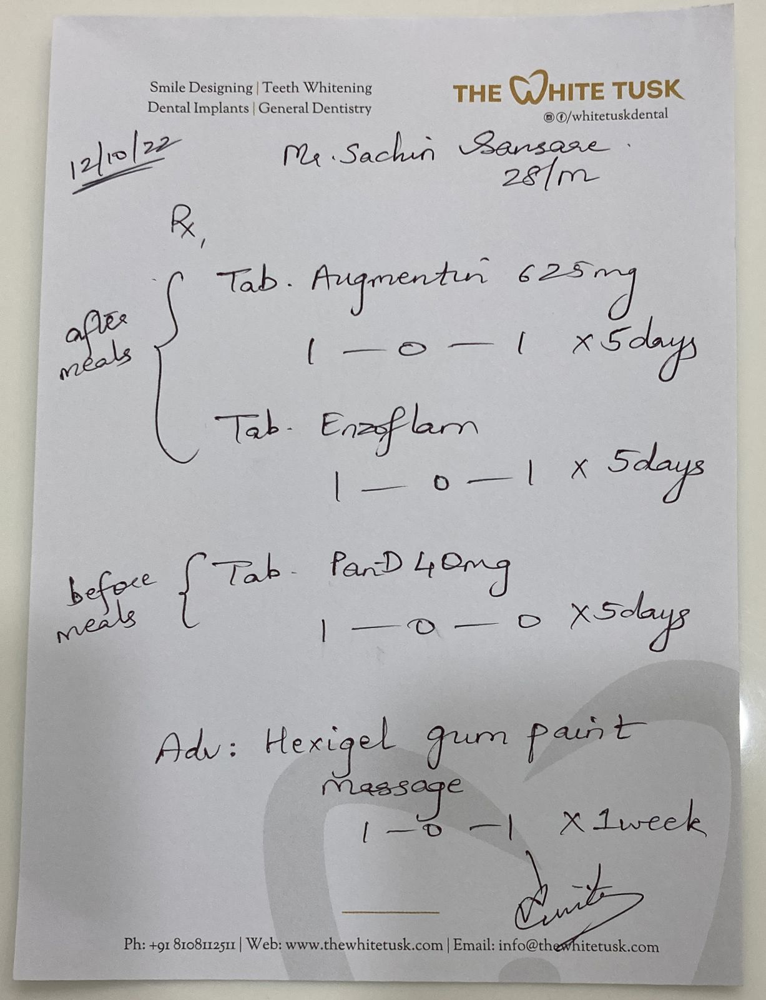

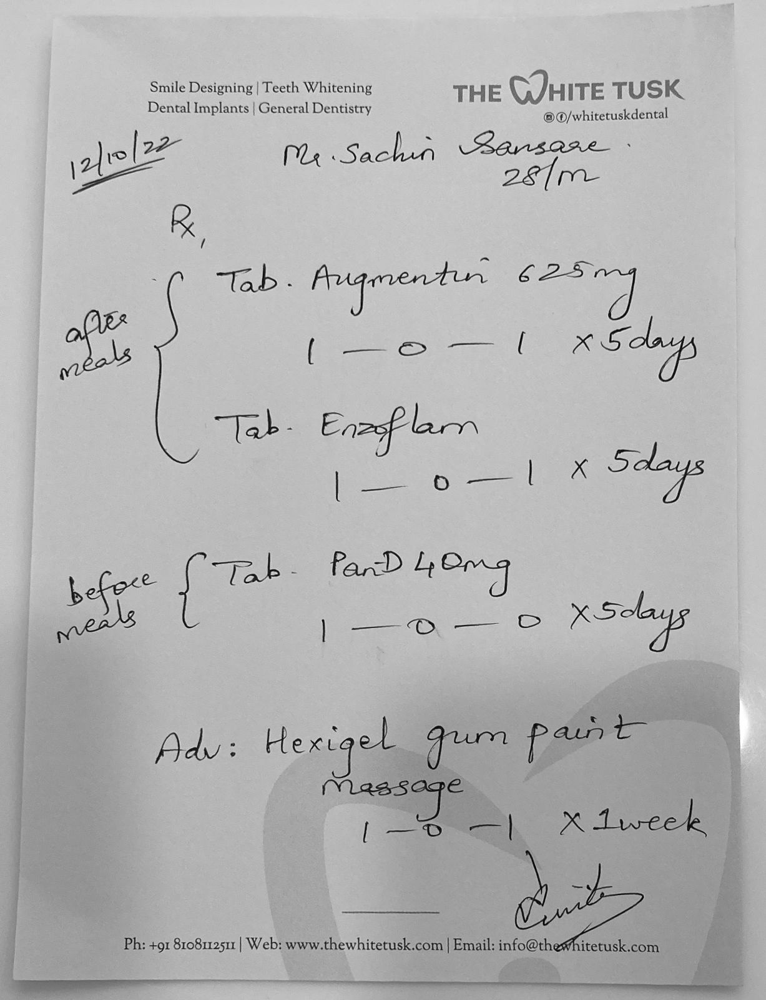

In [ ]:
import cv2
import os
import numpy as np
import matplotlib.pyplot as plt
from google.colab.patches import cv2_imshow
from google.colab import files

# Upload and read image
uploaded = files.upload()
image_path = list(uploaded.keys())[0]
image = cv2.imread(image_path)
cv2_imshow(image)

# Grayscale and noise reduction
gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
# gray = cv2.GaussianBlur(gray, (5, 5), 0)  # Smoothing
# gray = cv2.bilateralFilter(gray, 9, 75, 75)
cv2_imshow(gray)

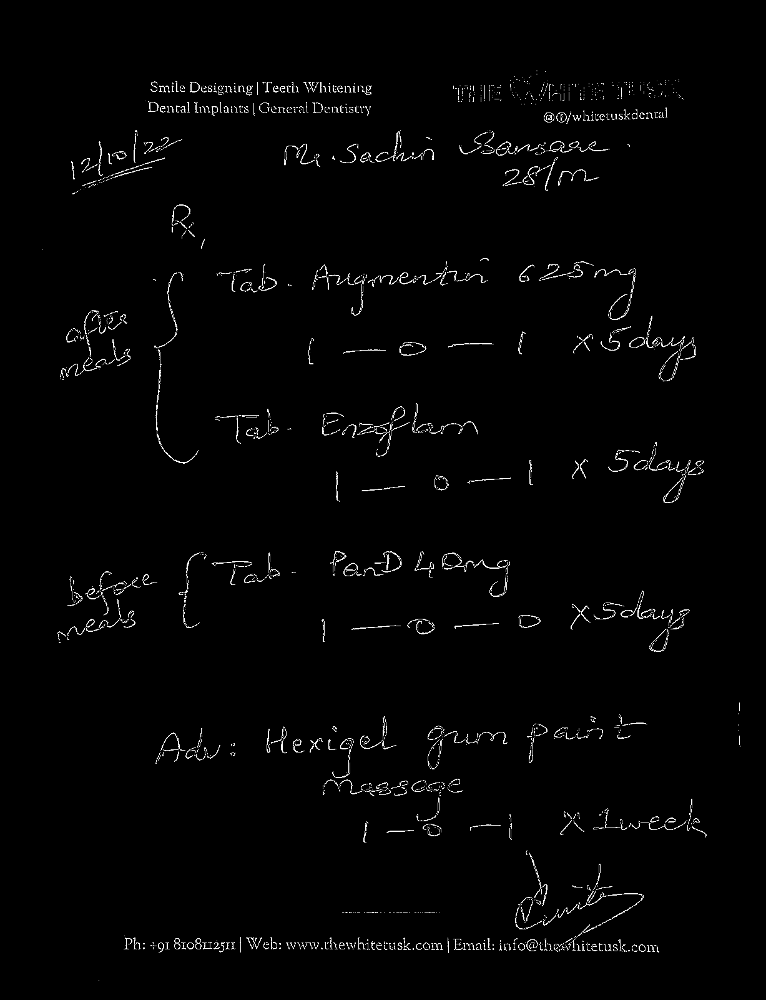

In [ ]:
# Adaptive thresholding
thresh = cv2.adaptiveThreshold(
    gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 3, 20
)
cv2_imshow(thresh)

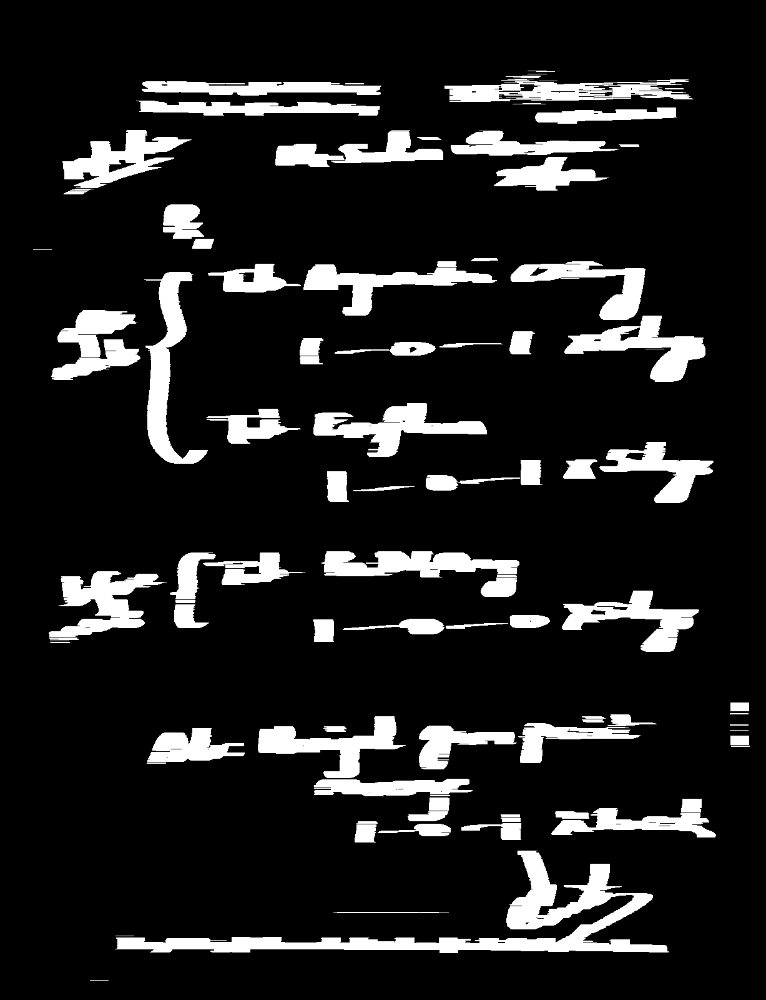

In [ ]:
# Dilation with a more refined kernel
# kernel = cv2.getStructuringElement(cv2.MORPH_RECT, (25, 5))
kernel = np.ones((1,30), np.uint8)
img_dilation = cv2.dilate(thresh, kernel, iterations=1)
cv2_imshow(img_dilation)

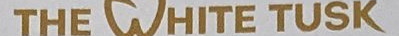

Saved: segmented_lines/medicine_5.png


Saved: segmented_lines/medicine_7.png


Saved: segmented_lines/medicine_10.png


Saved: segmented_lines/medicine_12.png


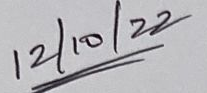

Saved: segmented_lines/medicine_13.png


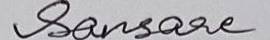

Saved: segmented_lines/medicine_15.png


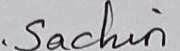

Saved: segmented_lines/medicine_16.png


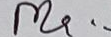

Saved: segmented_lines/medicine_18.png


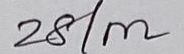

Saved: segmented_lines/medicine_20.png


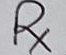

Saved: segmented_lines/medicine_23.png


Saved: segmented_lines/medicine_24.png


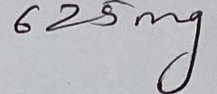

Saved: segmented_lines/medicine_28.png


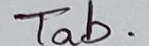

Saved: segmented_lines/medicine_29.png


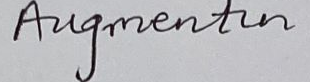

Saved: segmented_lines/medicine_30.png


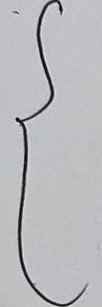

Saved: segmented_lines/medicine_31.png


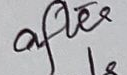

Saved: segmented_lines/medicine_32.png


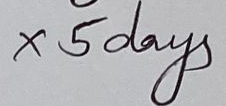

Saved: segmented_lines/medicine_33.png


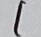

Saved: segmented_lines/medicine_34.png


Saved: segmented_lines/medicine_35.png


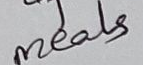

Saved: segmented_lines/medicine_36.png


Saved: segmented_lines/medicine_37.png


Saved: segmented_lines/medicine_40.png


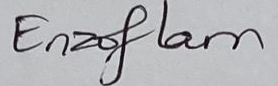

Saved: segmented_lines/medicine_41.png


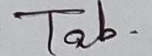

Saved: segmented_lines/medicine_42.png


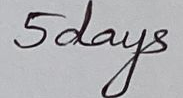

Saved: segmented_lines/medicine_43.png


Saved: segmented_lines/medicine_44.png


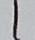

Saved: segmented_lines/medicine_45.png


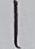

Saved: segmented_lines/medicine_46.png


Saved: segmented_lines/medicine_47.png


Saved: segmented_lines/medicine_48.png


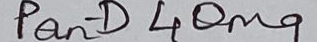

Saved: segmented_lines/medicine_50.png


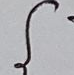

Saved: segmented_lines/medicine_51.png


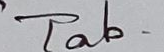

Saved: segmented_lines/medicine_52.png


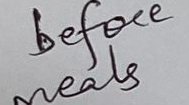

Saved: segmented_lines/medicine_53.png


Saved: segmented_lines/medicine_55.png


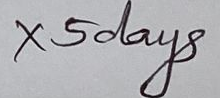

Saved: segmented_lines/medicine_56.png


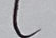

Saved: segmented_lines/medicine_58.png


Saved: segmented_lines/medicine_59.png


Saved: segmented_lines/medicine_60.png


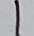

Saved: segmented_lines/medicine_61.png


Saved: segmented_lines/medicine_66.png


Saved: segmented_lines/medicine_68.png


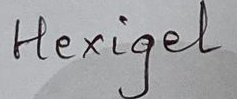

Saved: segmented_lines/medicine_69.png


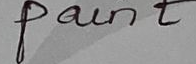

Saved: segmented_lines/medicine_72.png


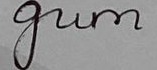

Saved: segmented_lines/medicine_74.png


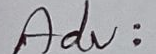

Saved: segmented_lines/medicine_76.png


Saved: segmented_lines/medicine_78.png


Saved: segmented_lines/medicine_81.png


Saved: segmented_lines/medicine_83.png


Saved: segmented_lines/medicine_84.png


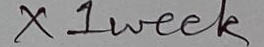

Saved: segmented_lines/medicine_85.png


Saved: segmented_lines/medicine_86.png


Saved: segmented_lines/medicine_87.png


Saved: segmented_lines/medicine_91.png


Saved: segmented_lines/medicine_92.png


Saved: segmented_lines/medicine_93.png


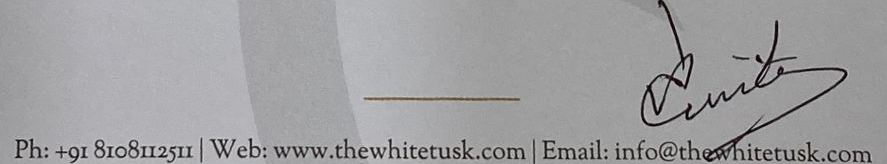

Saved: segmented_lines/medicine_94.png


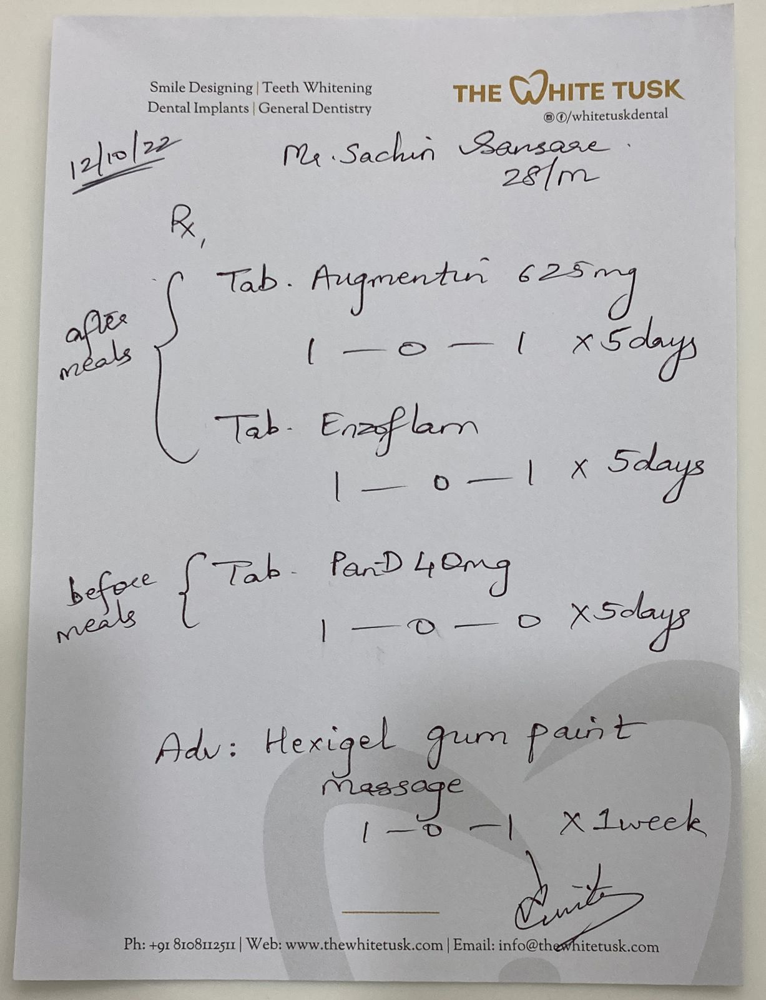

In [ ]:
# Contour detection and filtering by size
ctrs, _ = cv2.findContours(img_dilation, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
sorted_ctrs = sorted(ctrs, key=lambda ctr: (cv2.boundingRect(ctr)[1], cv2.boundingRect(ctr)[0]))

# Create output directory to store each segmented line image
output_dir = "segmented_lines"
os.makedirs(output_dir, exist_ok=True)

# Draw bounding boxes and display ROIs
for i, ctr in enumerate(sorted_ctrs):
    x, y, w, h = cv2.boundingRect(ctr)
    if w >= 10 and h >= 10:  # Filter small contours
        roi = image[y:y+h, x:x+w]
        cv2_imshow(roi)

        # Save the image
        output_path = f"{output_dir}/medicine_{i+1}.png"
        cv2.imwrite(output_path, cv2.cvtColor(roi, cv2.COLOR_RGB2BGR))  # Convert to BGR for saving
        print(f"Saved: {output_path}")

        # cv2.rectangle(image, (x, y), (x + w, y + h), (90, 0, 255), 2)

cv2_imshow(image)


In [ ]:
# Create output directory to store each segmented line image
word_dir = "Segmented_Words"
os.makedirs(word_dir, exist_ok=True)
word_cnt = 0

In [ ]:
# Preprocess image for word segmentation with stricter filters to reduce letter segmentation
def preprocess_image_for_words(image):
    # gray = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
    blurred = cv2.GaussianBlur(gray, (3, 3), 0)

    # Adjust the dilation to capture words, not individual letters
    # _, binary_thresh = cv2.threshold(blurred, 150, 255, cv2.THRESH_BINARY_INV)
    thresh = cv2.adaptiveThreshold(
      gray, 255, cv2.ADAPTIVE_THRESH_MEAN_C, cv2.THRESH_BINARY_INV, 3, 20
    )
    kernel = np.ones((10, 3), np.uint8)  # Larger kernel for better word grouping
    dilated = cv2.dilate(thresh, kernel, iterations=2)

    return dilated

In [ ]:
# Word Segmentation: Split handwritten part into words using bounding boxes
def segment_words(handwritten_part):
    processed_image = preprocess_image_for_words(handwritten_part)
    contours, _ = cv2.findContours(processed_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    # sorted_contours = sorted(contours, key=lambda ctr: (cv2.boundingRect(ctr)[1], cv2.boundingRect(ctr)[0]))

    word_boxes = []
    for contour in contours:
        x, y, w, h = cv2.boundingRect(contour)
        # Fine-tuned filter: Enforcing stricter size conditions to capture words, not letters
        if w > 40 and h > 30 and w < 300 and h < 100:  # Adjust for whole words
            word_boxes.append((x, y, w, h))

    word_boxes = sorted(word_boxes, key=lambda box: box[0])  # Sort by x-coordinate

    # Visualize word bounding boxes
    word_image = handwritten_part.copy()
    for (wx, wy, ww, wh) in word_boxes:
        word_roi = handwritten_part[wy:wy+wh, wx:wx+ww]

        # Save each handwritten word as a separate image
        global word_cnt
        word_cnt = word_cnt + 1;
        output_path = f"{word_dir}/word_{word_cnt+1}.png"
        cv2.imwrite(output_path, word_roi)
        print(f"Saved: {output_path}")
        cv2.rectangle(word_image, (wx, wy), (wx + ww, wy + wh), (0, 255, 0), 2)

    plt.figure(figsize=(5, 5))
    plt.imshow(cv2.cvtColor(word_image, cv2.COLOR_BGR2RGB))
    plt.title("Word Bounding Boxes")
    plt.axis('off')
    plt.show()

    return word_boxes

medicine_23.png


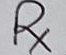

Saved: Segmented_Words/word_2.png


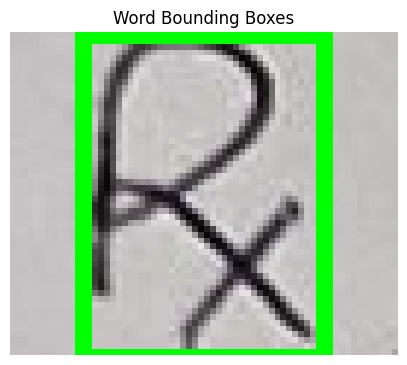

medicine_28.png


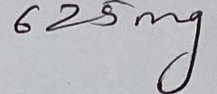

Saved: Segmented_Words/word_3.png


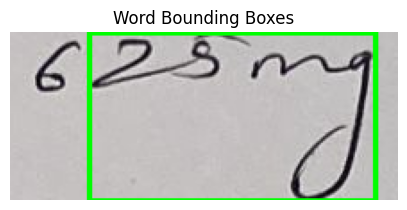

medicine_45.png


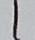

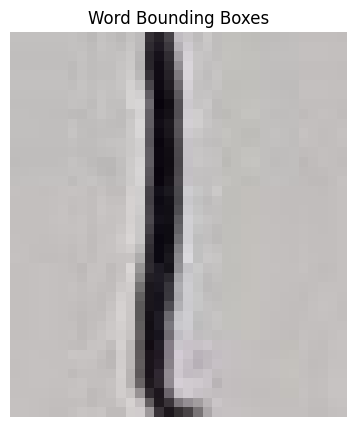

medicine_74.png


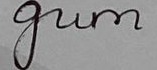

Saved: Segmented_Words/word_4.png


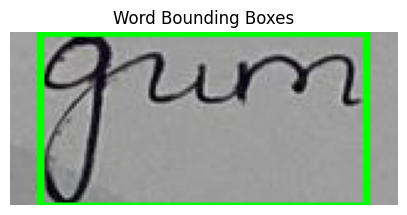

medicine_72.png


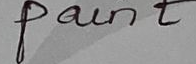

Saved: Segmented_Words/word_5.png
Saved: Segmented_Words/word_6.png


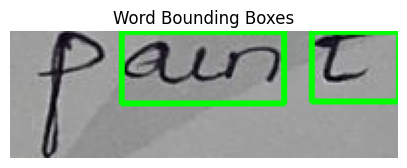

medicine_7.png


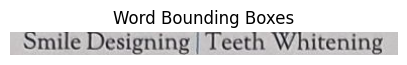

medicine_86.png


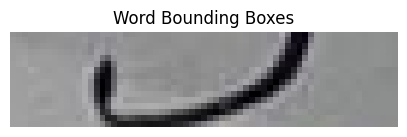

medicine_30.png


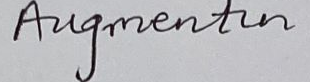

Saved: Segmented_Words/word_7.png


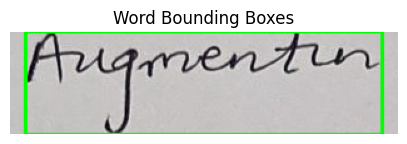

medicine_68.png


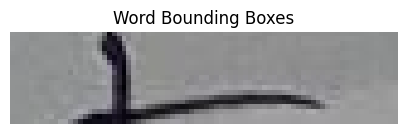

medicine_10.png


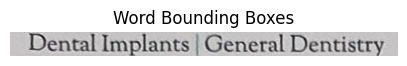

medicine_12.png


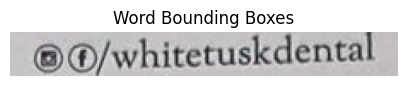

medicine_48.png


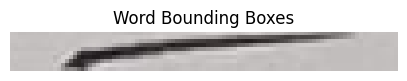

medicine_93.png


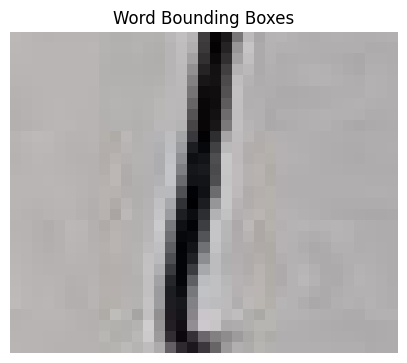

medicine_85.png


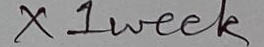

Saved: Segmented_Words/word_8.png
Saved: Segmented_Words/word_9.png


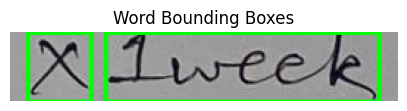

medicine_69.png


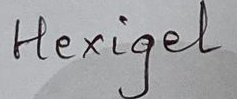

Saved: Segmented_Words/word_10.png


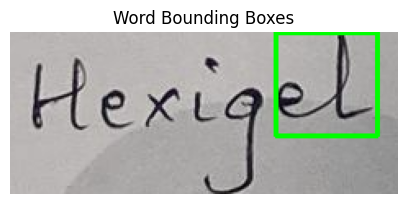

medicine_44.png


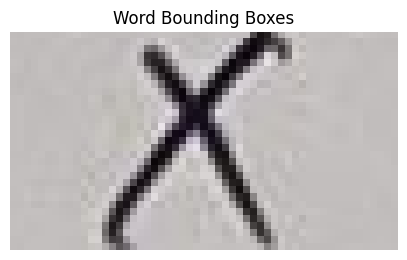

medicine_60.png


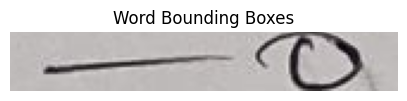

medicine_31.png


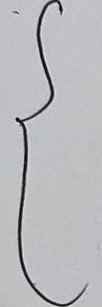

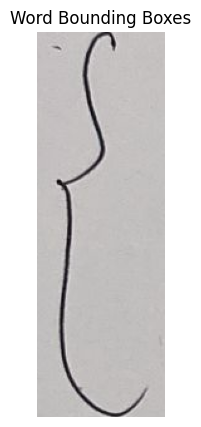

medicine_13.png


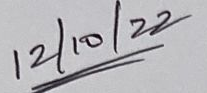

Saved: Segmented_Words/word_11.png


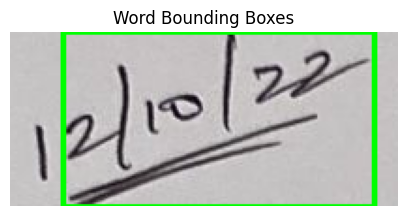

medicine_42.png


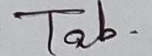

Saved: Segmented_Words/word_12.png


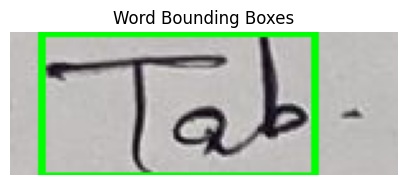

medicine_46.png


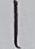

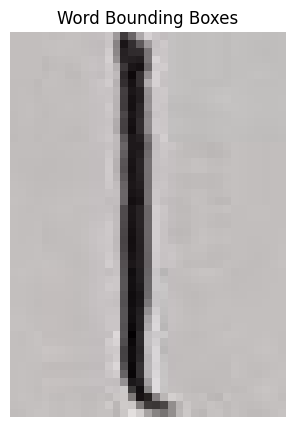

medicine_52.png


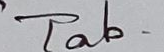

Saved: Segmented_Words/word_13.png


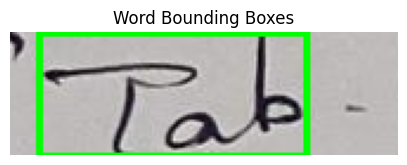

medicine_36.png


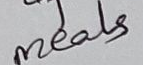

Saved: Segmented_Words/word_14.png


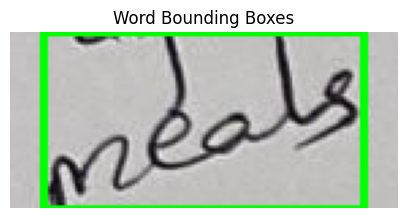

medicine_41.png


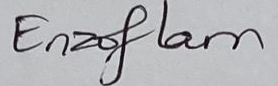

Saved: Segmented_Words/word_15.png


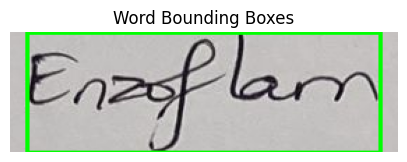

medicine_84.png


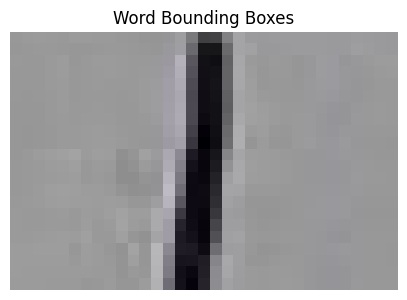

medicine_83.png


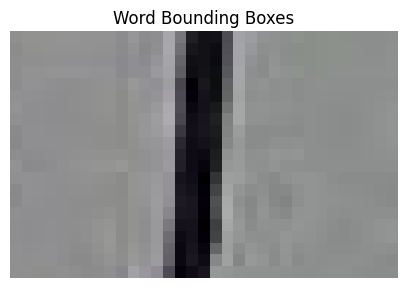

medicine_56.png


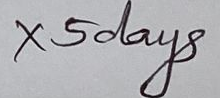

Saved: Segmented_Words/word_16.png


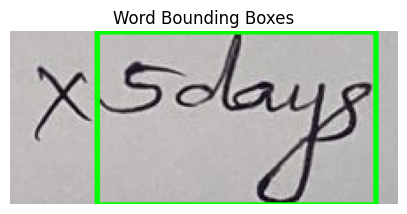

medicine_92.png


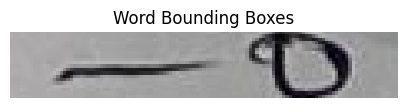

medicine_35.png


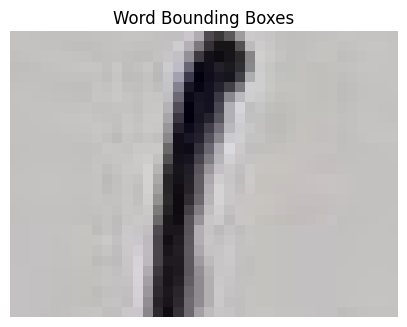

medicine_94.png


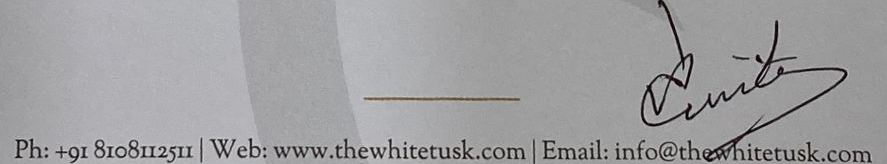

Saved: Segmented_Words/word_17.png
Saved: Segmented_Words/word_18.png
Saved: Segmented_Words/word_19.png
Saved: Segmented_Words/word_20.png


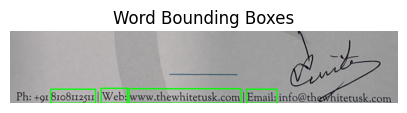

medicine_61.png


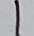

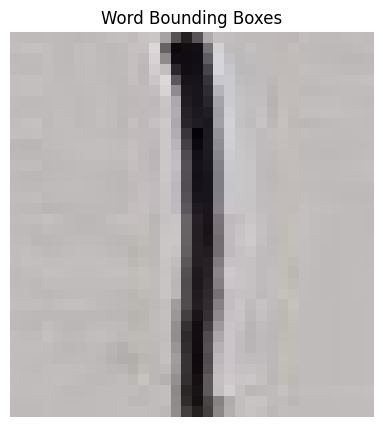

medicine_15.png


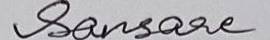

Saved: Segmented_Words/word_21.png


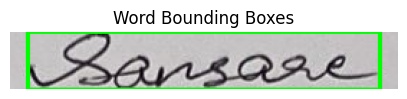

medicine_18.png


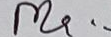

Saved: Segmented_Words/word_22.png


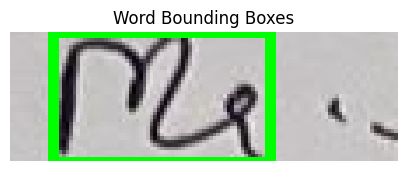

medicine_47.png


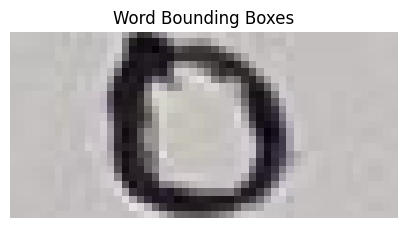

medicine_32.png


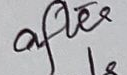

Saved: Segmented_Words/word_23.png


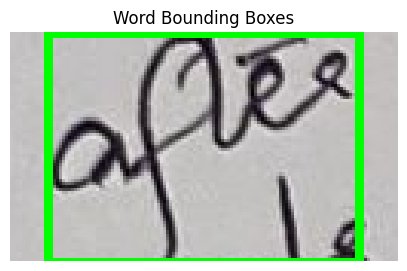

medicine_55.png


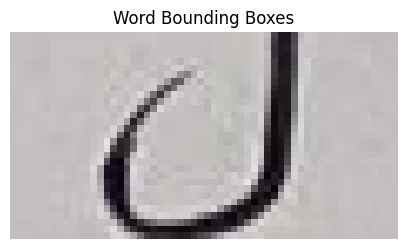

medicine_50.png


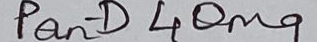

Saved: Segmented_Words/word_24.png
Saved: Segmented_Words/word_25.png


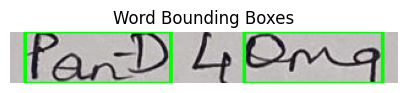

medicine_76.png


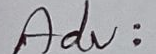

Saved: Segmented_Words/word_26.png


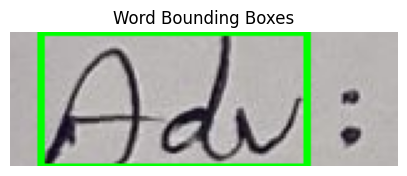

medicine_51.png


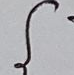

Saved: Segmented_Words/word_27.png


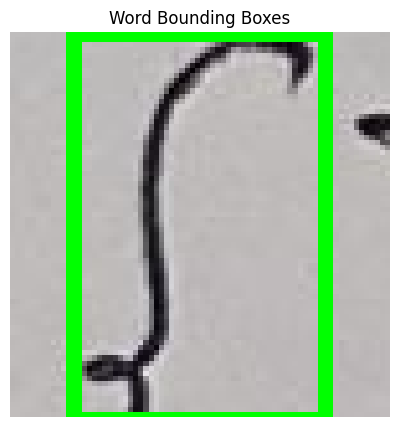

medicine_40.png


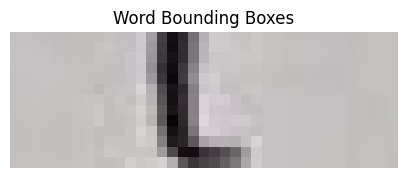

medicine_81.png


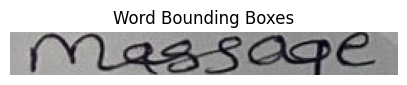

medicine_43.png


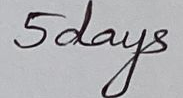

Saved: Segmented_Words/word_28.png


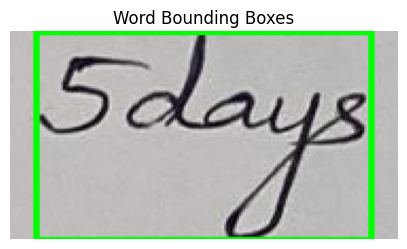

medicine_58.png


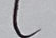

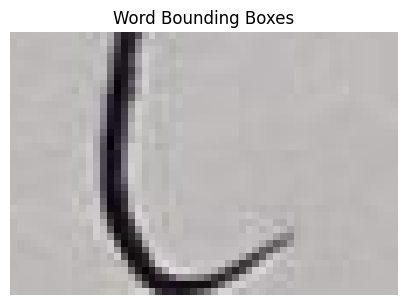

medicine_59.png


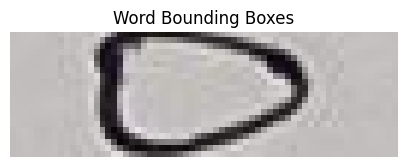

medicine_91.png


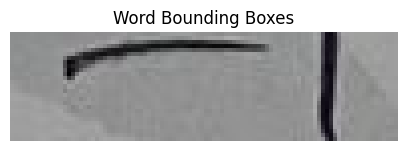

medicine_87.png


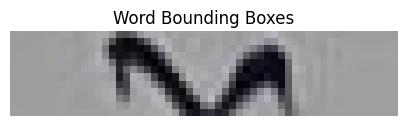

medicine_20.png


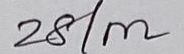

Saved: Segmented_Words/word_29.png
Saved: Segmented_Words/word_30.png


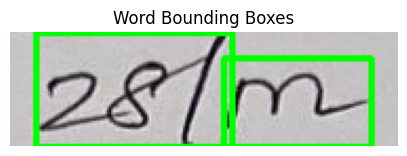

medicine_78.png


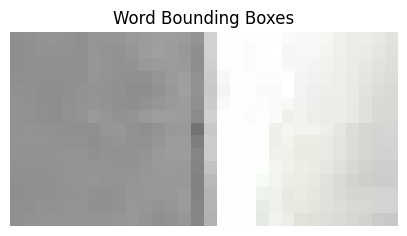

medicine_24.png


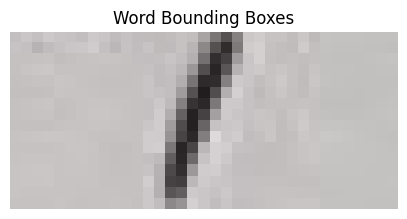

medicine_29.png


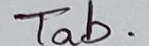

Saved: Segmented_Words/word_31.png


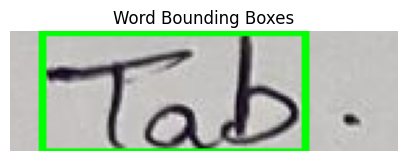

medicine_66.png


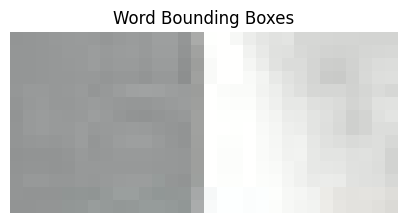

medicine_37.png


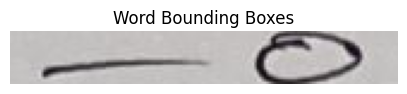

medicine_16.png


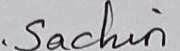

Saved: Segmented_Words/word_32.png


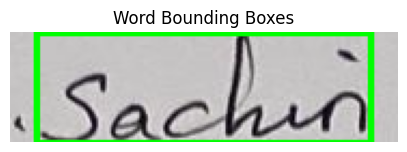

medicine_34.png


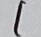

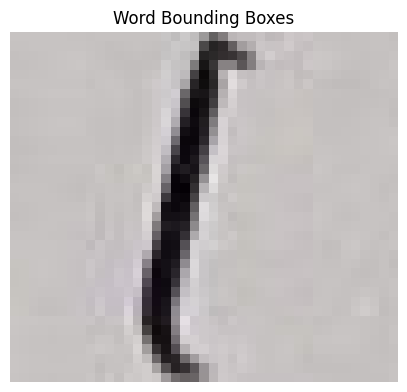

medicine_33.png


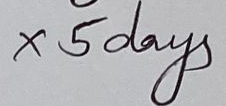

Saved: Segmented_Words/word_33.png


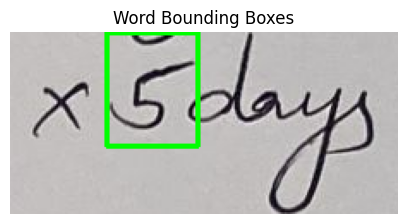

medicine_53.png


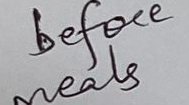

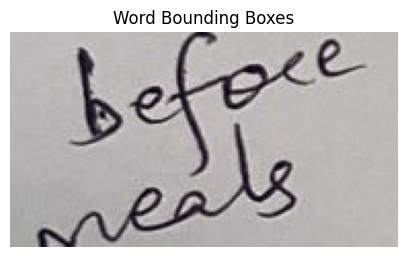

medicine_5.png


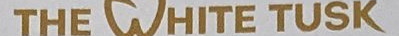

Saved: Segmented_Words/word_34.png


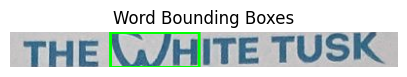

In [ ]:
word_boxes = []

# Step 2: Word segmentation - Split the handwritten part into words using bounding boxes
for segm_line in os.listdir(output_dir):
  print(segm_line)
  line_image = cv2.imread(os.path.join(output_dir, segm_line))
  cv2_imshow(cv2.cvtColor(line_image, cv2.COLOR_BGR2RGB))
  boxes = segment_words(line_image)
  word_boxes.extend(boxes)

word_17.png


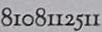

word_29.png


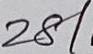

word_14.png


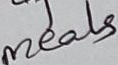

word_19.png


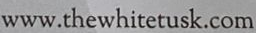

word_15.png


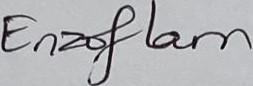

word_10.png


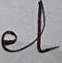

word_28.png


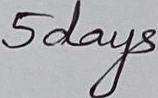

word_9.png


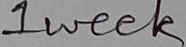

word_18.png


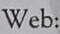

word_22.png


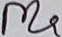

word_2.png


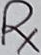

word_13.png


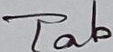

word_4.png


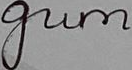

word_11.png


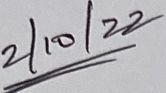

word_24.png


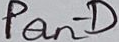

word_30.png


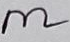

word_6.png


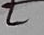

word_26.png


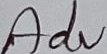

word_20.png


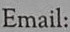

word_7.png


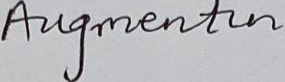

word_25.png


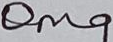

word_5.png


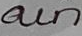

word_12.png


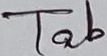

word_3.png


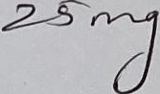

word_27.png


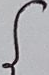

word_31.png


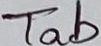

word_34.png


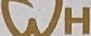

word_32.png


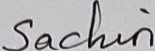

word_33.png


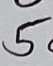

word_16.png


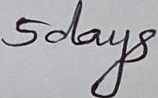

word_23.png


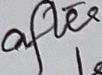

word_8.png


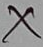

word_21.png


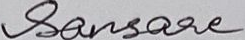

In [ ]:
for segm_word in os.listdir(word_dir):
  print(segm_word)
  word_image = cv2.imread(os.path.join(word_dir, segm_word))
  cv2_imshow(cv2.cvtColor(word_image, cv2.COLOR_BGR2RGB))

In [ ]:
# Install necessary libraries
!pip install tensorflow pillow numpy

import numpy as np
import pickle
from tensorflow.keras.models import load_model
from tensorflow.keras.preprocessing.sequence import pad_sequences
from tensorflow.keras.applications.resnet50 import preprocess_input
from PIL import Image
import os
from google.colab import drive

In [ ]:
# Load saved model
model = load_model("/content/complete_model.h5")  # Update with actual path

# Load tokenizer
with open("/content/tokenizer.pkl", "rb") as f:  # Update with actual path
    tokenizer = pickle.load(f)

In [ ]:
# Parameters (same as used during training)
IMAGE_HEIGHT = 64
IMAGE_WIDTH = 64
IMAGE_CHANNELS = 3
MAX_SEQ_LENGTH = model.input[1].shape[1]

In [ ]:
# Utility function to preprocess image
def preprocess_single_image(image_path):
    try:
        img = Image.open(image_path).convert('RGB')
        img = img.resize((IMAGE_WIDTH, IMAGE_HEIGHT))
        img_array = np.array(img)
        img_array = preprocess_input(img_array)
        return np.expand_dims(img_array, axis=0)
    except Exception as e:
        print(f"Error processing image: {e}")
        return None

# Utility function to preprocess text input
def preprocess_text(text_input):
    text_sequence = tokenizer.texts_to_sequences([text_input])
    return pad_sequences(text_sequence, maxlen=MAX_SEQ_LENGTH, padding='post')


In [ ]:
# Predict function
def predict_on_image(image_path, text_input, top_k=5):
    processed_image = preprocess_single_image(image_path)
    if processed_image is None:
        print("Image processing failed.")
        return

    text_sequence = tokenizer.texts_to_sequences([text_input])
    padded_text_sequence = pad_sequences(text_sequence, maxlen=max_seq_length, padding='post')

    prediction_prob = model.predict([processed_image, padded_text_sequence])
    top_k_indices = prediction_prob[0].argsort()[-top_k:][::-1]

    word_index_to_token = {v: k for k, v in tokenizer.word_index.items()}

    print(f"\nPredictions for: {os.path.basename(image_path)}")
    for i, idx in enumerate(top_k_indices):
        predicted_word = word_index_to_token.get(idx, "<Unknown>")
        confidence = prediction_prob[0][idx]
        print(f"{i+1}. {predicted_word} (confidence: {confidence:.4f})")

In [ ]:
import os

def predict_on_folder(folder_path, text_input, top_k=5):
    predictions = {}
    for img_name in os.listdir(folder_path):
        img_path = os.path.join(folder_path, img_name)

        # Skip non-image files
        if not img_path.lower().endswith(('.png', '.jpg', '.jpeg')):
            continue

        processed_image = preprocess_single_image(img_path)
        if processed_image is None:
            predictions[img_name] = "<Error loading image>"
            continue

        text_sequence = tokenizer.texts_to_sequences([text_input])
        padded_text_sequence = pad_sequences(text_sequence, maxlen=MAX_SEQ_LENGTH, padding='post')

        prediction_prob = model.predict([processed_image, padded_text_sequence])
        top_k_indices = prediction_prob[0].argsort()[-top_k:][::-1]

        word_index_to_token = {v: k for k, v in tokenizer.word_index.items()}

        top_predictions = []
        for i, idx in enumerate(top_k_indices):
            predicted_word = word_index_to_token.get(idx, "<Unknown>")
            confidence = prediction_prob[0][idx]
            top_predictions.append((predicted_word, confidence))

        # Save the top-1 prediction (you can modify to save top-k list if needed)
        predictions[img_name] = top_predictions[0][0]

        # Optional: print top-k predictions for inspection
        print(f"\nPredictions for {img_name}:")
        for i, (word, conf) in enumerate(top_predictions):
            print(f"{i+1}. {word} (confidence: {conf:.4f})")

    return predictions



In [ ]:
# Example usage
if __name__ == "__main__":
    folder_path = "/content/Segmented_Words"  # Update with your image folder path
    text_input = "Example transcription input"

    predictions = predict_on_folder(folder_path, text_input)

    for img_name, predicted_word in predictions.items():
        print(f"{img_name} => Predicted Word: {predicted_word}")

1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step

Predictions for word_17.png:
1. beyond (confidence: 0.0190)
2. sides (confidence: 0.0174)
3. fell (confidence: 0.0168)
4. line (confidence: 0.0151)
5. maxwell (confidence: 0.0151)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 90ms/step

Predictions for word_29.png:
1. beyond (confidence: 0.0190)
2. sides (confidence: 0.0174)
3. fell (confidence: 0.0168)
4. line (confidence: 0.0151)
5. maxwell (confidence: 0.0151)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 118ms/step

Predictions for word_14.png:
1. beyond (confidence: 0.0190)
2. sides (confidence: 0.0174)
3. fell (confidence: 0.0168)
4. line (confidence: 0.0151)
5. maxwell (confidence: 0.0151)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 101ms/step

Predictions for word_19.png:
1. beyond (confidence: 0.0190)
2. sides (confidence: 0.0174)
3. fell (confidence: 0.0168)
4. line (confidence: 0.0151)
5. maxwell (confidence: 0.0151)
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 92ms/step

Predictions for word_15.png:
1. beyond (confidence: 0.0190)
2. sides (confidence: 0.0